Not all models can visualize equally good. Let's compare three models:
1. Google's ViT
2. Facebook's DEIT
3. Facebook's DINO
First two models are trained in supervised manner, while the last one - in unsupervised. That affects on the quality of visualizations.

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
from src.models.vit.vision_transformer import ViT
from src.models.xai.attention_rollout import VITAttentionRollout
from src.models.xai.grad_rollout import VITAttentionGradRollout
from src.utils.device import get_device
from src.data.transform import ImageTransform
from PIL import Image


import cv2
from matplotlib import pyplot as plt
import numpy as np
import torch
from torch import nn
from urllib.request import urlopen

In [3]:
DEVICE = get_device(prioritize_gpu=False)
DEVICE

'cpu'

## Images

In [4]:
IMAGE_SIZE = 224

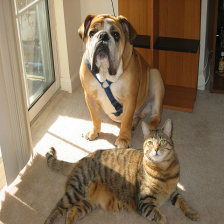

In [5]:
image_1 = Image.open("../../data/raw/both.png").resize((IMAGE_SIZE, IMAGE_SIZE))
image_1

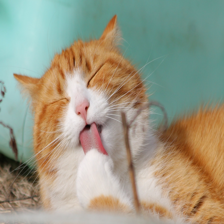

In [6]:
image_2 = Image.open("../orange_cat.jpg").resize((IMAGE_SIZE, IMAGE_SIZE))
image_2

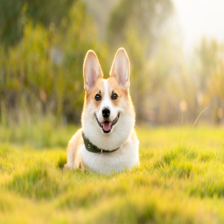

In [7]:
image_3 = Image.open("../corgi_image.jpg").resize((IMAGE_SIZE, IMAGE_SIZE))
image_3

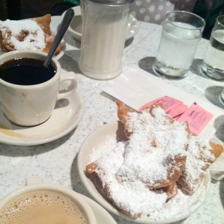

In [8]:
image_4 = Image.open(
    urlopen("https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/beignets-task-guide.png")
).resize((IMAGE_SIZE, IMAGE_SIZE))
image_4

In [9]:
images = [image_1, image_2, image_3, image_4]

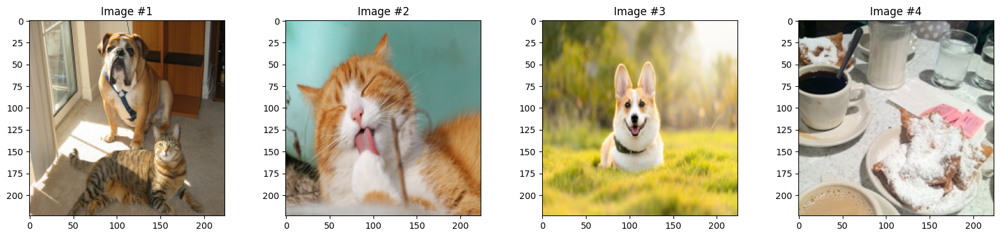

In [10]:
fig, axes = plt.subplots(1, 4, figsize=(20, 4))
axes = axes.ravel()
for idx in range(len(images)):
    axes[idx].set_title(f"Image #{idx+1}")
    axes[idx].imshow(images[idx])
plt.show()

### Transform images

In [11]:
image_transform = ImageTransform(resize_to=IMAGE_SIZE)
# image_transform = ImageTransform(resize_to=image_size * scale_factor, mean=data_config["mean"], std=data_config["std"])
inputs = [image_transform(image).to(DEVICE) for image in images]
for input in inputs:
    print(f"Shape: {input.shape}, device: {input.device}")

Shape: torch.Size([1, 3, 224, 224]), device: cpu
Shape: torch.Size([1, 3, 224, 224]), device: cpu
Shape: torch.Size([1, 3, 224, 224]), device: cpu
Shape: torch.Size([1, 3, 224, 224]), device: cpu


## Attention rollout

In [12]:
def show_mask_on_image(img, mask):
    img = np.float32(img) / 255
    heatmap = cv2.applyColorMap(np.uint8(255 * mask), cv2.COLORMAP_JET)
    heatmap = np.float32(heatmap) / 255
    cam = heatmap + np.float32(img)
    cam = cam / np.max(cam)
    return np.uint8(255 * cam)


def apply_mask_and_save(image, mask, filename):
    np_img = np.array(image)[:, :, ::-1]  # rgb -> bgr
    # cv2.resize(mask, *np_img.shape[:2][::-1])
    mask = cv2.resize(mask, (np_img.shape[1], np_img.shape[0]))
    mask = show_mask_on_image(np_img, mask)
    file_path = f"../../data/interim/{filename}.png"
    cv2.imwrite(file_path, mask)
    return file_path

## Google's Vision Transformer (ViT)

In [13]:
model = ViT.from_pretrained("google/vit-base-patch16-224")
model.eval()
print()

2023-07-17 19:44:32.405 | DEBUG    | src.models.vit.vision_transformer:from_pretrained:252 - Loading pretrained Huggingface model of size 'google/vit-base-patch16-224' ...
2023-07-17 19:44:33.730 | DEBUG    | src.models.vit.vision_transformer:from_pretrained:254 - Huggingface model is loaded.
2023-07-17 19:44:33.734 | DEBUG    | src.models.vit.vision_transformer:from_pretrained:274 - Creating ViT model with parameters: {'image_size': 224, 'num_channels': 3, 'patch_size': 16, 'embeddings_size': 768, 'head_size': None, 'num_heads': 12, 'feed_forward_scaling': 4, 'bias': True, 'dropout': 0.0, 'num_layers': 12, 'num_classes': 1000}
2023-07-17 19:44:34.338 | DEBUG    | src.models.vit.vision_transformer:__init__:119 - ViT model is created with number of parameters: 86.57 million
2023-07-17 19:44:34.339 | DEBUG    | src.models.vit.vision_transformer:from_pretrained:278 - ViT model is created.
2023-07-17 19:44:34.392 | DEBUG    | src.models.vit.vision_transformer:from_pretrained:333 - Weights 

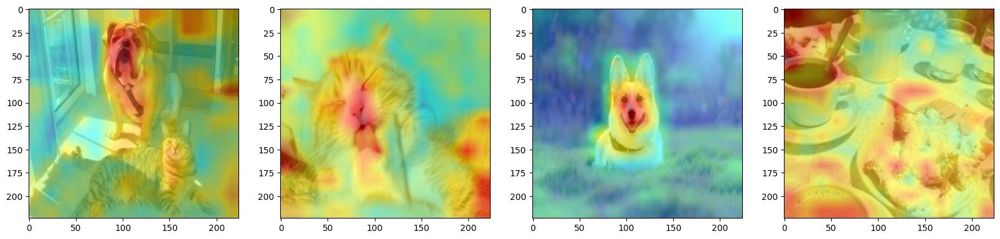

In [14]:
attention_rollout = VITAttentionRollout(
    model,
    attention_layer_name="attention_dropout",
    head_fusion="mean",
    discard_ratio=0.0,
)

image_masks = []
for idx in range(len(images)):
    mask = attention_rollout(inputs[idx])
    image_mask = Image.open(apply_mask_and_save(images[idx], mask, f"image_{idx}_heatmap"))
    image_masks.append(image_mask)

fig, axes = plt.subplots(1, 4, figsize=(20, 10))
axes = iter(axes.ravel())
for image_mask in image_masks:
    ax = next(axes)
    ax.imshow(image_mask)
plt.show()

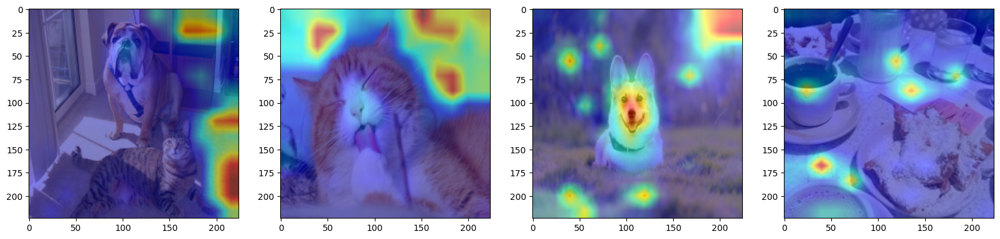

In [15]:
attention_rollout = VITAttentionRollout(
    model,
    attention_layer_name="attention_dropout",
    head_fusion="mean",
    discard_ratio=0.9,
)

image_masks = []
for idx in range(len(images)):
    mask = attention_rollout(inputs[idx])
    image_mask = Image.open(apply_mask_and_save(images[idx], mask, f"image_{idx}_heatmap"))
    image_masks.append(image_mask)

fig, axes = plt.subplots(1, 4, figsize=(20, 10))
axes = iter(axes.ravel())
for image_mask in image_masks:
    ax = next(axes)
    ax.imshow(image_mask)
plt.show()

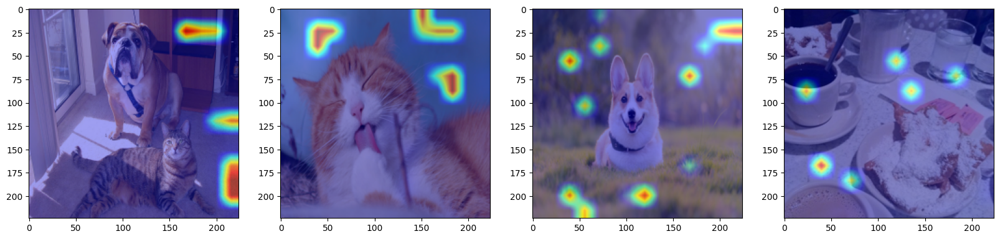

In [16]:
attention_rollout = VITAttentionRollout(
    model,
    attention_layer_name="attention_dropout",
    head_fusion="min",
    discard_ratio=0.9,
)

image_masks = []
for idx in range(len(images)):
    mask = attention_rollout(inputs[idx])
    image_mask = Image.open(apply_mask_and_save(images[idx], mask, f"image_{idx}_heatmap"))
    image_masks.append(image_mask)

fig, axes = plt.subplots(1, 4, figsize=(20, 10))
axes = iter(axes.ravel())
for image_mask in image_masks:
    ax = next(axes)
    ax.imshow(image_mask)
plt.show()

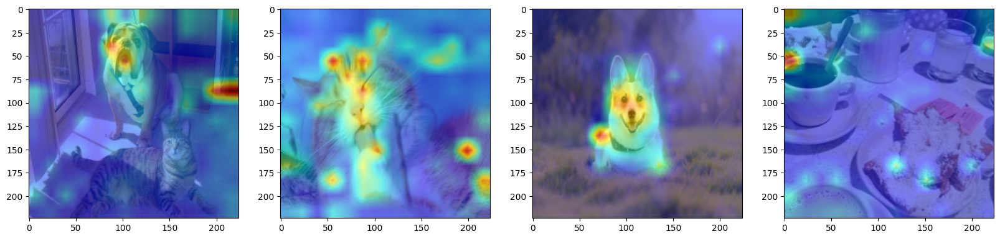

In [17]:
attention_rollout = VITAttentionRollout(
    model,
    attention_layer_name="attention_dropout",
    head_fusion="max",
    discard_ratio=0.9,
)

image_masks = []
for idx in range(len(images)):
    mask = attention_rollout(inputs[idx])
    image_mask = Image.open(apply_mask_and_save(images[idx], mask, f"image_{idx}_heatmap"))
    image_masks.append(image_mask)

fig, axes = plt.subplots(1, 4, figsize=(20, 10))
axes = iter(axes.ravel())
for image_mask in image_masks:
    ax = next(axes)
    ax.imshow(image_mask)
plt.show()

-----

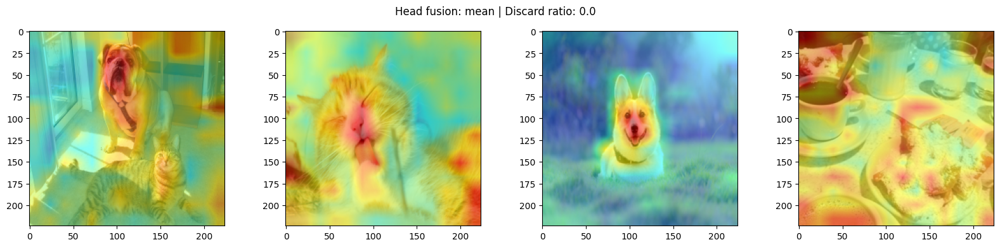

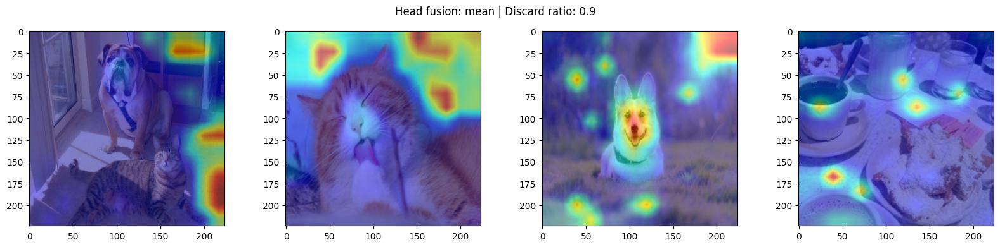

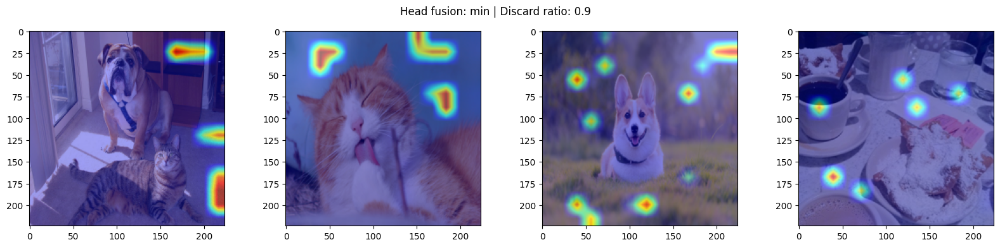

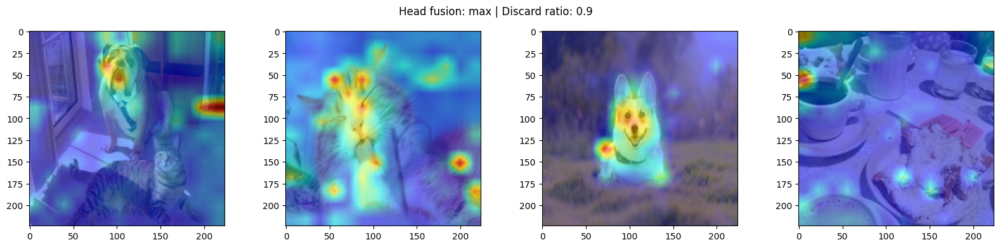

In [18]:
for fusion, discard_ratio in (("mean", 0.0), ("mean", 0.9), ("min", 0.9), ("max", 0.9)):
    attention_rollout = VITAttentionRollout(
        model,
        attention_layer_name="attention_dropout",
        head_fusion=fusion,
        discard_ratio=discard_ratio,
    )

    image_masks = []
    for idx in range(len(images)):
        mask = attention_rollout(inputs[idx])
        image_mask = Image.open(apply_mask_and_save(images[idx], mask, f"image_{idx}_heatmap"))
        image_masks.append(image_mask)

    fig, axes = plt.subplots(1, 4, figsize=(20, 4))
    fig.suptitle(f"Head fusion: {fusion} | Discard ratio: {discard_ratio}")
    axes = iter(axes.ravel())
    for image_mask in image_masks:
        ax = next(axes)
        ax.imshow(image_mask)
    plt.show()

### Grad rollout

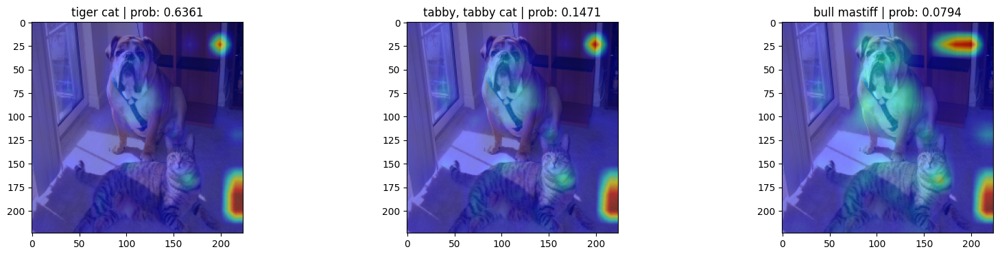

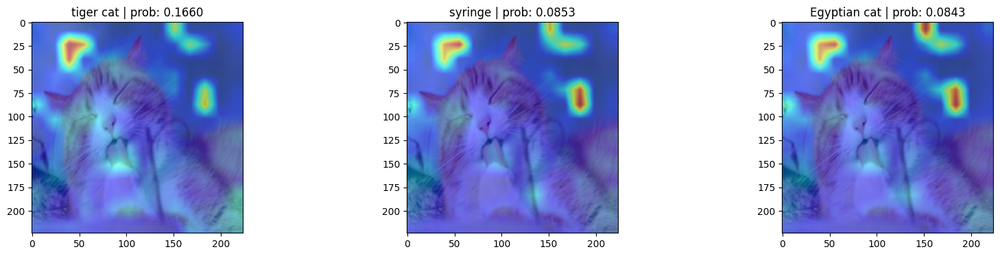

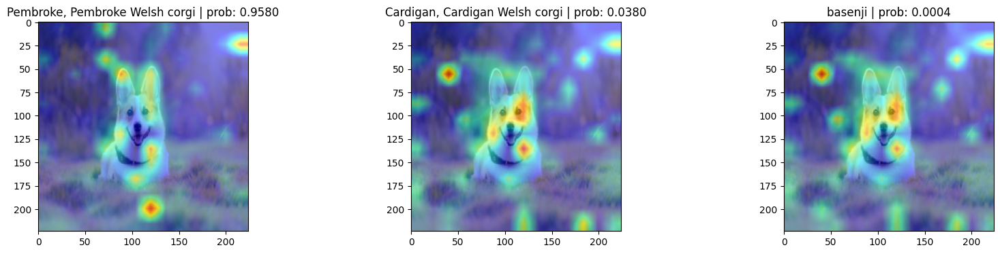

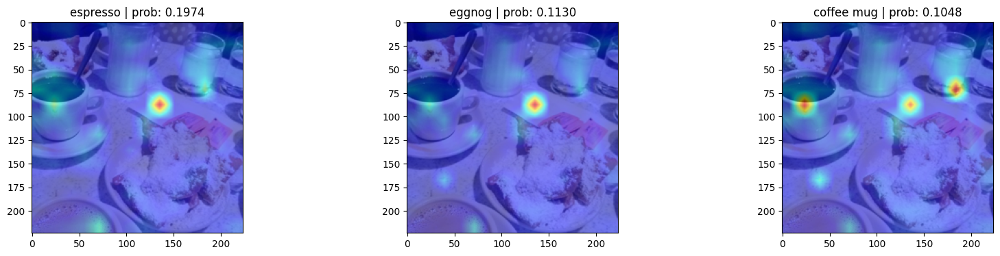

In [19]:
for idx in range(len(inputs)):
    attention_rollout = VITAttentionGradRollout(
        model,
        attention_layer_name="attention_dropout",
        discard_ratio=0.9,
    )

    image_masks = []
    probs = model(inputs[idx])[0].softmax(dim=-1)
    class_ids = probs.argsort(descending=True)[:3].tolist()
    for class_idx in class_ids:
        mask = attention_rollout(inputs[idx], class_idx)
        image_mask = Image.open(apply_mask_and_save(images[idx], mask, f"image_{idx}_{class_idx}_heatmap"))
        image_masks.append(image_mask)

    fig, axes = plt.subplots(1, 3, figsize=(20, 4))
    # fig.suptitle(f"Image #{idx + 1}")
    axes = iter(axes.ravel())
    for mask_idx in range(len(image_masks)):
        ax = next(axes)
        ax.set_title(f"{model.id2label[class_ids[mask_idx]]} | prob: {probs[class_ids[mask_idx]].item():.4f}")
        ax.imshow(image_masks[mask_idx])
    plt.show()

## Meta's DeIT

In [20]:
model = ViT.from_pretrained("facebook/deit-tiny-patch16-224")
model.eval()
print()

2023-07-17 19:45:06.175 | WARNING  | src.models.vit.vision_transformer:from_pretrained:249 - Only '('google/vit-base-patch16-224',)' were tested, but 'facebook/deit-tiny-patch16-224' was provide.
2023-07-17 19:45:06.176 | DEBUG    | src.models.vit.vision_transformer:from_pretrained:252 - Loading pretrained Huggingface model of size 'facebook/deit-tiny-patch16-224' ...
2023-07-17 19:45:06.541 | DEBUG    | src.models.vit.vision_transformer:from_pretrained:254 - Huggingface model is loaded.
2023-07-17 19:45:06.545 | DEBUG    | src.models.vit.vision_transformer:from_pretrained:274 - Creating ViT model with parameters: {'image_size': 224, 'num_channels': 3, 'patch_size': 16, 'embeddings_size': 192, 'head_size': None, 'num_heads': 3, 'feed_forward_scaling': 4, 'bias': True, 'dropout': 0.0, 'num_layers': 12, 'num_classes': 1000}
2023-07-17 19:45:06.610 | DEBUG    | src.models.vit.vision_transformer:__init__:119 - ViT model is created with number of parameters: 5.72 million
2023-07-17 19:45:06

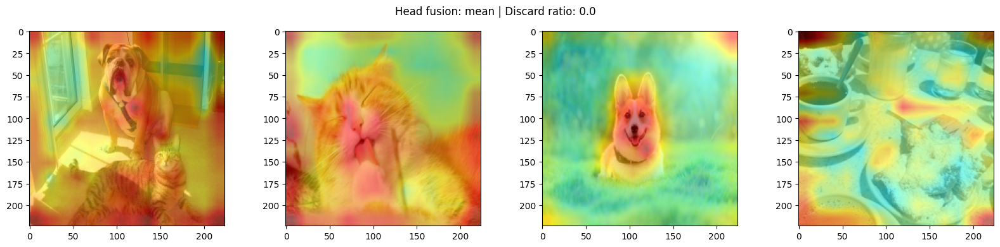

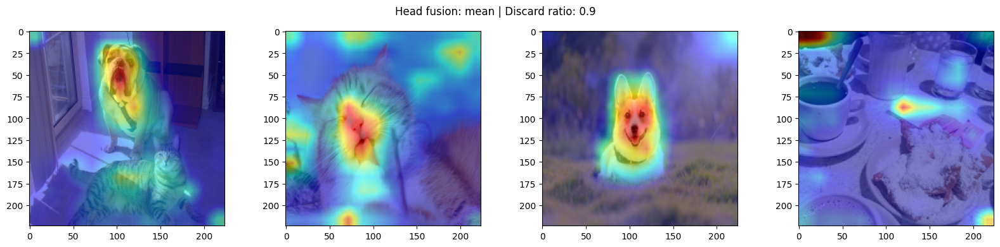

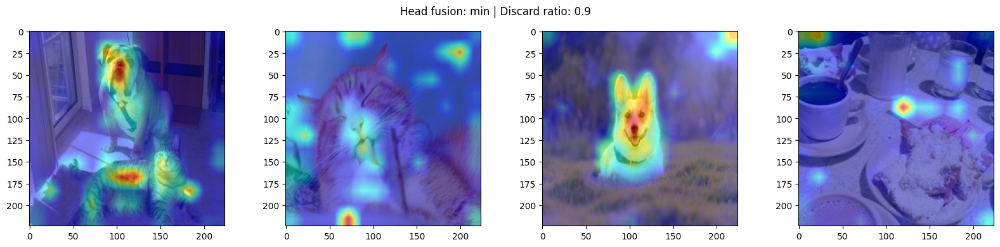

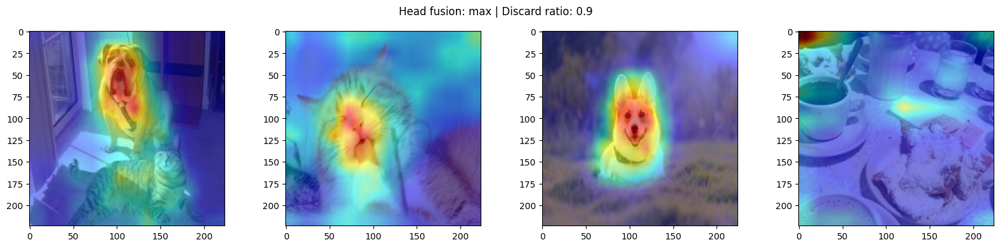

In [21]:
for fusion, discard_ratio in (("mean", 0.0), ("mean", 0.9), ("min", 0.9), ("max", 0.9)):
    attention_rollout = VITAttentionRollout(
        model,
        attention_layer_name="attention_dropout",
        head_fusion=fusion,
        discard_ratio=discard_ratio,
    )

    image_masks = []
    for idx in range(len(images)):
        mask = attention_rollout(inputs[idx])
        image_mask = Image.open(apply_mask_and_save(images[idx], mask, f"image_{idx}_heatmap"))
        image_masks.append(image_mask)

    fig, axes = plt.subplots(1, 4, figsize=(20, 4))
    fig.suptitle(f"Head fusion: {fusion} | Discard ratio: {discard_ratio}")
    axes = iter(axes.ravel())
    for image_mask in image_masks:
        ax = next(axes)
        ax.imshow(image_mask)
    plt.show()

### Grad rollout

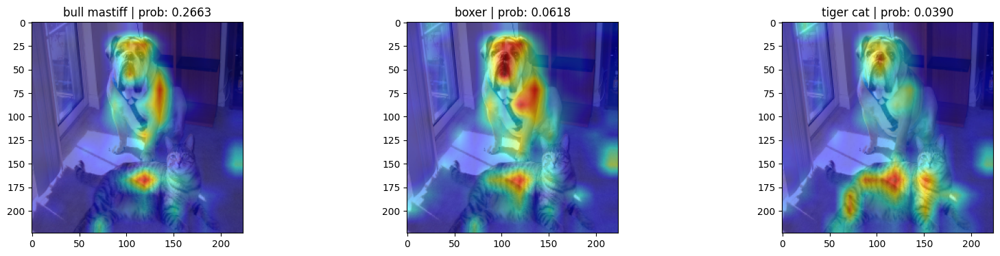

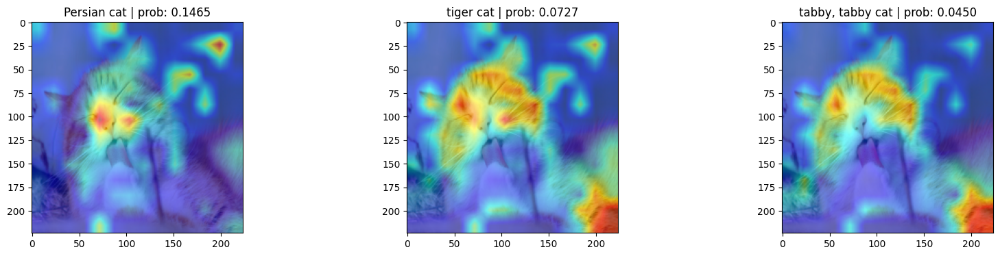

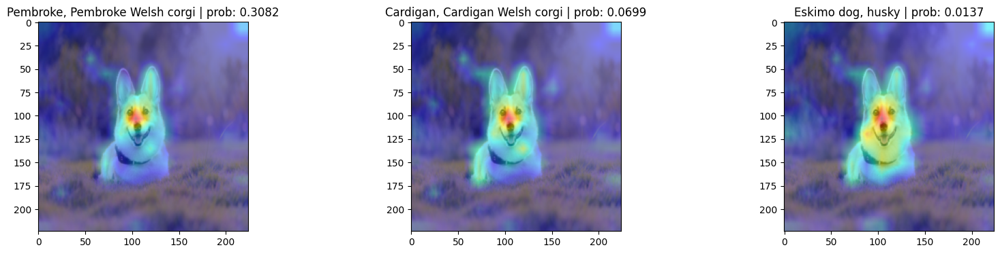

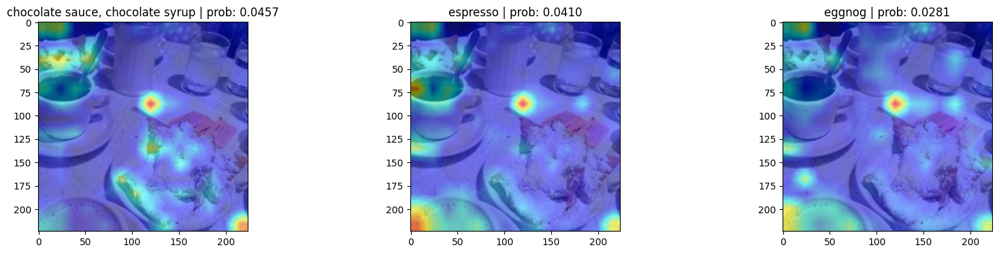

In [22]:
for idx in range(len(inputs)):
    attention_rollout = VITAttentionGradRollout(
        model,
        attention_layer_name="attention_dropout",
        discard_ratio=0.9,
    )

    image_masks = []
    probs = model(inputs[idx])[0].softmax(dim=-1)
    class_ids = probs.argsort(descending=True)[:3].tolist()
    for class_idx in class_ids:
        mask = attention_rollout(inputs[idx], class_idx)
        image_mask = Image.open(apply_mask_and_save(images[idx], mask, f"image_{idx}_{class_idx}_heatmap"))
        image_masks.append(image_mask)

    fig, axes = plt.subplots(1, 3, figsize=(20, 4))
    # fig.suptitle(f"Image #{idx + 1}")
    axes = iter(axes.ravel())
    for mask_idx in range(len(image_masks)):
        ax = next(axes)
        ax.set_title(f"{model.id2label[class_ids[mask_idx]]} | prob: {probs[class_ids[mask_idx]].item():.4f}")
        ax.imshow(image_masks[mask_idx])
    plt.show()

## Meta's DINO

In [23]:
model = ViT.from_pretrained("facebook/dino-vits16").to(DEVICE)
model.eval()
print()

2023-07-17 19:45:20.873 | WARNING  | src.models.vit.vision_transformer:from_pretrained:249 - Only '('google/vit-base-patch16-224',)' were tested, but 'facebook/dino-vits16' was provide.
2023-07-17 19:45:20.874 | DEBUG    | src.models.vit.vision_transformer:from_pretrained:252 - Loading pretrained Huggingface model of size 'facebook/dino-vits16' ...
Some weights of ViTForImageClassification were not initialized from the model checkpoint at facebook/dino-vits16 and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
2023-07-17 19:45:21.383 | DEBUG    | src.models.vit.vision_transformer:from_pretrained:254 - Huggingface model is loaded.
2023-07-17 19:45:21.387 | DEBUG    | src.models.vit.vision_transformer:from_pretrained:274 - Creating ViT model with parameters: {'image_size': 224, 'num_channels': 3, 'patch_size': 16, 'embeddings_size': 384, 'head_size': None, 'num_h

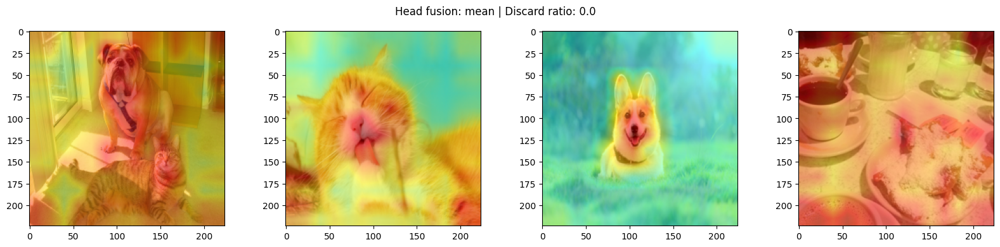

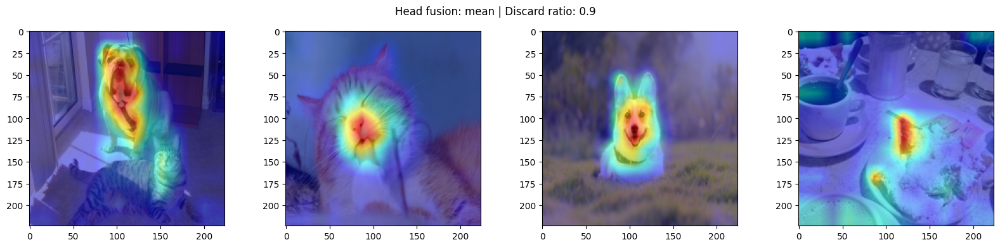

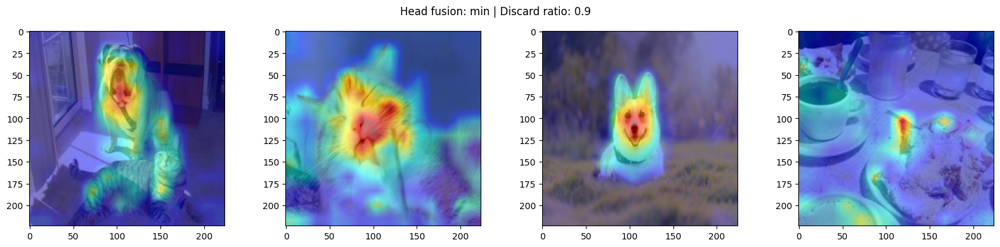

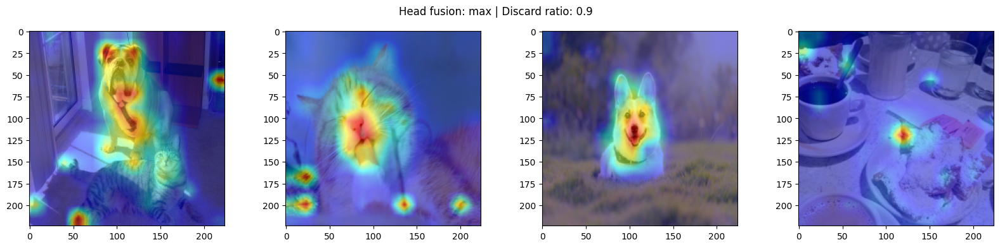

In [24]:
for fusion, discard_ratio in (("mean", 0.0), ("mean", 0.9), ("min", 0.9), ("max", 0.9)):
    attention_rollout = VITAttentionRollout(
        model,
        attention_layer_name="attention_dropout",
        head_fusion=fusion,
        discard_ratio=discard_ratio,
    )

    image_masks = []
    for idx in range(len(images)):
        mask = attention_rollout(inputs[idx])
        image_mask = Image.open(apply_mask_and_save(images[idx], mask, f"image_{idx}_heatmap"))
        image_masks.append(image_mask)

    fig, axes = plt.subplots(1, 4, figsize=(20, 4))
    fig.suptitle(f"Head fusion: {fusion} | Discard ratio: {discard_ratio}")
    axes = iter(axes.ravel())
    for image_mask in image_masks:
        ax = next(axes)
        ax.imshow(image_mask)
    plt.show()